In [1]:
# 1st time login required
!dwarf login


In order to allow dwarf to work with your foundry account
 please  proceed to the following link in your browser:
https://foundry.novartis.com/multipass/api/oauth2/authorize?client_id=66905ce5843d5def5429ef5915d3ee65&redirect_uri=https%3A%2F%2Fdwarf.d42atp.aws.novartis.net%2Foauth%2Fcallback&response_type=code&scope=compass%3Adiscover+compass%3Aread-resource+foundry%3Aread-data+compass%3Aview-project-group+monocle%3Aview+compass%3Aview+foundry%3Aread-files+offline_access+profile+email+lime%3Asearch+compass%3Acollections%3Aview-collection-metadata+ontology%3Aview-workflow+ontology%3Aview-associated-resource+artifacts%3Afiles%3Aread-artifact+slate%3Aview-document+objects%3Aread-data+stemma%3Aread-repository+fusion%3Aread-document+compass%3Aview-project-group+vector%3Aview+classifier%3Aview-resource+phonograph2%3Aread-data+notepad%3Aview+foundry%3Aread-branch+compass%3Aopen-resource-links+compass%3Aread-branch+compass%3Aview-project-imports+compass%3Aview-contact-information+compass%3Ali

In [105]:
# checking present working directory
!pwd

/home/puruspu3


In [3]:
# command format to pull data

# !dwarf dataset download "RID of that dataset" "present working directory"
# for example (uncomment and run next line, if required change RID)
# !dwarf dataset download "ri.foundry.main.dataset.9bfb3c8c-aac6-4e5a-96bc-032dfc3126c6" "/home/puruspu3"

#!dwarf dataset download "ri.foundry.main.dataset.5f4dfbd2-fc68-4625-8dea-5ed7288dc794" "/home/puruspu3"

Total 8 % 4 / 50 [====>-----------------------------------------------------] 0s
Total   8 % 4 / 50 [===>----------------------------------------------------] 0s
spark/part-00002-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet 100…  
Total   8 % 4 / 50 [===>----------------------------------------------------] 0s
spark/part-00002-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet 100…  
Total 8 % 4 / 50 [====>-----------------------------------------------------] 0s
Total 10 % 5 / 50 [=====>---------------------------------------------------] 0s
spark/part-00001-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet 16 …  
spark/part-00003-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet 55 …  
Total  12 % 6 / 50 [======>-------------------------------------------------] 0s
spark/part-00001-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet  38…  
spark/part-00003-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet 100…  
Total  12 % 6 / 50 [======>-

In [2]:
# importing important libraries

# array related calculation etc
import numpy as np

# table related calculation/manipulation etc
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# removing warnings
import warnings
warnings.filterwarnings('ignore')

In [185]:
#spark/part-00000-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet
#spark/part-00049-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet


In [4]:
"""
for i in range(0, 50):
    if i<10:
        path_parquet = "spark/part-0000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet"
        df = pd.read_parquet(path_parquet)
        path_csv = "spark/part-0000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"
        df.to_csv(path_csv)
    else:
        path_parquet = "spark/part-000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet"
        df = pd.read_parquet(path_parquet)
        path_csv = "spark/part-000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"
        df.to_csv(path_csv)
"""

'\nfor i in range(0, 50):\n    if i<10:\n        path_parquet = "spark/part-0000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet"\n        df = pd.read_parquet(path_parquet)\n        path_csv = "spark/part-0000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"\n        df.to_csv(path_csv)\n    else:\n        path_parquet = "spark/part-000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet"\n        df = pd.read_parquet(path_parquet)\n        path_csv = "spark/part-000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"\n        df.to_csv(path_csv)\n'

In [5]:
"""
dataset = pd.concat([pd.read_csv("spark/part-00000-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"), 
                     pd.read_csv("spark/part-00001-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv")],
                                 axis=0)
for i in range(2, 50):
    if i<10:
        path_csv = "spark/part-0000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"
        temp_dataset = pd.read_csv(path_csv)
        dataset = pd.concat([dataset, temp_dataset], axis=0)
    else:
        path_csv = "spark/part-000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"
        temp_dataset = pd.read_csv(path_csv)
        dataset = pd.concat([dataset, temp_dataset], axis=0)     
    
"""

'\ndataset = pd.concat([pd.read_csv("spark/part-00000-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"), \n                     pd.read_csv("spark/part-00001-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv")],\n                                 axis=0)\nfor i in range(2, 50):\n    if i<10:\n        path_csv = "spark/part-0000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"\n        temp_dataset = pd.read_csv(path_csv)\n        dataset = pd.concat([dataset, temp_dataset], axis=0)\n    else:\n        path_csv = "spark/part-000"+str(i)+"-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv"\n        temp_dataset = pd.read_csv(path_csv)\n        dataset = pd.concat([dataset, temp_dataset], axis=0)     \n    \n'

In [6]:
#dataset.to_csv("spark/part-00051151-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv")

In [3]:
dataset = pd.read_csv("spark/part-00051151-ab8f08b6-e278-4186-9121-d0e279c30d44-c000.snappy.parquet.csv")

In [4]:
dx_column = ['401', 'I10', 'hypertension']

In [5]:
dataset = dataset[dataset['dx'].isin(dx_column)]

In [10]:
#dataset.to_csv("all_3_dx_patient.csv")

In [11]:
# checking few rows of dataset 

def show(data):
    # dimension of datset
    print("*"*101)
    print("NUMBER OF ROWS ARE : {} & NUMBER OF COLUMNS ARE : {}".format(data.shape[0], data.shape[1]))
    
    # displaying all columns in output instead of first and last few columns only
    pd.set_option("display.max_columns", data.shape[1])
    
    print("*"*101)
    print("FIRST 5 ROWS:")
    print("*"*101)
    display(data.head()) # by default 5 rows
    
    print("*"*101)
    
    print("LAST 10 ROWS:")
    print("*"*101)
    display(data.tail(10)) # last 10 rows
    
show(dataset)

*****************************************************************************************************
NUMBER OF ROWS ARE : 372970 & NUMBER OF COLUMNS ARE : 98
*****************************************************************************************************
FIRST 5 ROWS:
*****************************************************************************************************


,Unnamed: 0,Unnamed: 0.1,ptid,dx_date,dx,table,index_dx,gender,birth_yr,ageatindex,race,division,region,hf_bl_pat,ihd_bl,af_bl,ckd_bl,obesity_bl,rf_bl,diabetes_bl,cvd_bl,dementia_bl,valvular_dis_bl,er_bl,bmi_bl,sbp_bl,dbp_bl,plt_bl,egfrs_bl,pr_bl,first_dt,last_dt,hdl_bl,crp_bl,gf_bl,buncrea_bl,bnp_bl,crtn_bl,trpn_bl,hscrp_bl,pbnp_bl,crtnu_bl,instr_bl,intrlkn_bl,lp_dr_blf,dpp4_inh_blf,sglt2_inh_blf,mra_blf,beta_blckr_blf,acei_blf,cal_chn_blckr_blf,chllow_blf,statin_blf,arb_blf,Biguanides_blf,insln_inj_blf,hf_inp_diag_dt,hfinp_cnt,hf_diag_dt,ELI_GRP_01,ELI_GRP_02,ELI_GRP_03,ELI_GRP_04,ELI_GRP_05,ELI_GRP_06,ELI_GRP_07,ELI_GRP_08,ELI_GRP_09,ELI_GRP_10,ELI_GRP_11,ELI_GRP_12,ELI_GRP_13,ELI_GRP_14,ELI_GRP_15,ELI_GRP_16,ELI_GRP_17,ELI_GRP_18,ELI_GRP_19,ELI_GRP_20,ELI_GRP_21,ELI_GRP_22,ELI_GRP_23,ELI_GRP_24,ELI_GRP_25,ELI_GRP_26,ELI_GRP_27,ELI_GRP_28,ELI_GRP_29,ELI_GRP_30,ELI_GRP_31,hf_inp_evt_cnsr_flg,hf_inp_evt_cnsr_dt,hf_diag_evt_cnsr_flg,hf_diag_evt_cnsr_dt,datediff_hfinp,datediff_mon_hfinp,datediff_hfdiag,datediff_mon_hfdiag
0,0,0,PT078204494,2016-05-20,I10,dx,1,Female,1935,81,Caucasian,East North Central,Midwest,0,1,1,0,0,0,0,0,0,1,NaN,21.6,155.0,100.0,295,99.0,72.0,2007-06-01,2021-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,1,0,1,0,0,0,0,0,NaN,0,NaN,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1686,56.200000,1686,56.200000
1,1,1,PT078205983,2016-04-03,I10,dx,1,Female,1935,81,Caucasian,East North Central,Midwest,0,0,0,0,0,0,0,0,0,0,NaN,27.6,182.0,86.0,NaN,NaN,NaN,2010-08-01,2016-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1733,57.766667,1733,57.766667
3,3,3,PT078332059,2016-09-16,I10,dx,1,Female,1947,69,Caucasian,East North Central,Midwest,0,1,0,0,1,0,1,0,0,0,NaN,38.1,145.0,78.0,NaN,NaN,73.0,2007-01-01,2019-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1567,52.233333,1567,52.233333
5,5,5,PT078365773,2016-01-14,I10,dx,1,Female,1954,62,African American,East North Central,Midwest,0,0,0,0,0,0,0,0,0,0,NaN,34.0,150.0,73.0,192,78.0,90.0,2008-06-01,2019-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1813,60.433333,1813,60.433333
7,7,7,PT078486264,2016-11-02,I10,dx,1,Female,1962,54,African American,East North Central,Midwest,0,0,0,0,0,0,0,0,0,0,NaN,38.4,160.0,86.0,NaN,NaN,78.0,2013-08-01,2019-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1520,50.666667,1520,50.666667


*****************************************************************************************************
LAST 10 ROWS:
*****************************************************************************************************


,Unnamed: 0,Unnamed: 0.1,ptid,dx_date,dx,table,index_dx,gender,birth_yr,ageatindex,race,division,region,hf_bl_pat,ihd_bl,af_bl,ckd_bl,obesity_bl,rf_bl,diabetes_bl,cvd_bl,dementia_bl,valvular_dis_bl,er_bl,bmi_bl,sbp_bl,dbp_bl,plt_bl,egfrs_bl,pr_bl,first_dt,last_dt,hdl_bl,crp_bl,gf_bl,buncrea_bl,bnp_bl,crtn_bl,trpn_bl,hscrp_bl,pbnp_bl,crtnu_bl,instr_bl,intrlkn_bl,lp_dr_blf,dpp4_inh_blf,sglt2_inh_blf,mra_blf,beta_blckr_blf,acei_blf,cal_chn_blckr_blf,chllow_blf,statin_blf,arb_blf,Biguanides_blf,insln_inj_blf,hf_inp_diag_dt,hfinp_cnt,hf_diag_dt,ELI_GRP_01,ELI_GRP_02,ELI_GRP_03,ELI_GRP_04,ELI_GRP_05,ELI_GRP_06,ELI_GRP_07,ELI_GRP_08,ELI_GRP_09,ELI_GRP_10,ELI_GRP_11,ELI_GRP_12,ELI_GRP_13,ELI_GRP_14,ELI_GRP_15,ELI_GRP_16,ELI_GRP_17,ELI_GRP_18,ELI_GRP_19,ELI_GRP_20,ELI_GRP_21,ELI_GRP_22,ELI_GRP_23,ELI_GRP_24,ELI_GRP_25,ELI_GRP_26,ELI_GRP_27,ELI_GRP_28,ELI_GRP_29,ELI_GRP_30,ELI_GRP_31,hf_inp_evt_cnsr_flg,hf_inp_evt_cnsr_dt,hf_diag_evt_cnsr_flg,hf_diag_evt_cnsr_dt,datediff_hfinp,datediff_mon_hfinp,datediff_hfdiag,datediff_mon_hfdiag
1698301,33025,33025,PT711124091,2016-04-21,I10,dx,1,Male,1950,66,Caucasian,East North Central,Midwest,0,0,0,0,0,0,0,0,0,0,NaN,26.6,102.0,78.0,NaN,NaN,69.0,2012-12-01,2021-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1715,57.166667,1715,57.166667
1698305,33029,33029,PT716425861,2016-05-11,I10,dx,1,Male,1976,40,Caucasian,East South Central,South,0,0,0,0,0,0,0,0,0,0,NaN,25.9,163.0,104.0,227.0,78.0,97.0,2009-03-01,2017-10-01,NaN,33.0,NaN,NaN,NaN,120.4,NaN,NaN,NaN,120.4,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1695,56.500000,1695,56.500000
1698306,33030,33030,PT717616058,2016-07-01,I10,dx,1,Female,1973,43,Caucasian,East North Central,Midwest,0,0,0,0,0,0,0,0,0,0,NaN,51.4,NaN,NaN,NaN,NaN,NaN,2013-07-01,2021-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,1,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1644,54.800000,1644,54.800000
1698307,33031,33031,PT719731943,2016-03-10,I10,dx,1,Female,1943,73,Caucasian,East North Central,Midwest,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,236.0,91.0,NaN,2012-07-01,2021-03-01,151.0,NaN,NaN,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1757,58.566667,1757,58.566667
1698308,33032,33032,PT722557979,2016-04-07,I10,dx,1,Female,1940,76,Caucasian,Pacific,West,0,0,0,0,0,0,0,0,0,0,NaN,NaN,150.0,88.0,NaN,NaN,92.0,2010-03-01,2019-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1729,57.633333,1729,57.633333
1698311,33035,33035,PT722807081,2016-12-09,I10,dx,1,Female,1971,45,Asian,Pacific,West,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2010-04-01,2021-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1483,49.433333,1483,49.433333
1698315,33039,33039,PT723419628,2016-12-20,I10,dx,1,Female,1948,68,Asian,Pacific,West,0,0,0,0,0,0,0,0,0,0,NaN,19.5,158.0,76.0,NaN,NaN,72.0,2011-01-01,2020-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1472,49.066667,1472,49.066667
1698316,33040,33040,PT723578491,2016-03-19,I10,dx,1,Female,1973,43,Caucasian,Pacific,West,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011-01-01,2021-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-12-31,0,2020-12-31,1748,58.266667,1748,58.266667
1698321,

In [6]:
# dropping first two columns, extra index column created during merging files

dataset.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1, inplace=True)
dataset.shape

(372970, 96)

In [7]:
output_related = dataset[['ptid', 'hf_inp_evt_cnsr_flg', 'hf_inp_evt_cnsr_dt', 'hf_diag_evt_cnsr_flg', 'hf_diag_evt_cnsr_dt',
                          'datediff_hfinp', 'datediff_mon_hfinp', 'datediff_hfdiag', 'datediff_mon_hfdiag', 'hf_inp_diag_dt',
                          'hfinp_cnt', 'hf_diag_dt']]
dataset.drop(['hf_inp_evt_cnsr_flg', 'hf_inp_evt_cnsr_dt', 'hf_diag_evt_cnsr_flg', 'hf_diag_evt_cnsr_dt',
                          'datediff_hfinp', 'datediff_mon_hfinp', 'datediff_hfdiag', 'datediff_mon_hfdiag', 'hf_inp_diag_dt',
                          'hfinp_cnt', 'hf_diag_dt'], axis=1, inplace=True)
output_related.shape, dataset.shape

((372970, 12), (372970, 85))

In [14]:
# checking missing value
pd.set_option('display.max_rows', 100)
(dataset.isnull().sum()/dataset.shape[0]).sort_values(ascending=True)

ptid                 0.000000
ELI_GRP_07           0.000000
ELI_GRP_06           0.000000
ELI_GRP_05           0.000000
ELI_GRP_04           0.000000
ELI_GRP_03           0.000000
ELI_GRP_02           0.000000
ELI_GRP_01           0.000000
insln_inj_blf        0.000000
Biguanides_blf       0.000000
arb_blf              0.000000
statin_blf           0.000000
chllow_blf           0.000000
cal_chn_blckr_blf    0.000000
acei_blf             0.000000
beta_blckr_blf       0.000000
mra_blf              0.000000
sglt2_inh_blf        0.000000
ELI_GRP_08           0.000000
ELI_GRP_09           0.000000
ELI_GRP_10           0.000000
ELI_GRP_11           0.000000
ELI_GRP_29           0.000000
ELI_GRP_28           0.000000
ELI_GRP_27           0.000000
ELI_GRP_26           0.000000
ELI_GRP_25           0.000000
ELI_GRP_24           0.000000
ELI_GRP_23           0.000000
ELI_GRP_22           0.000000
dpp4_inh_blf         0.000000
ELI_GRP_21           0.000000
ELI_GRP_19           0.000000
ELI_GRP_18

In [8]:
# dropping columns having missing value > 80%

dataset.drop(['er_bl', 'hdl_bl', 'crp_bl', 'gf_bl', 'buncrea_bl', 'bnp_bl',  
              'crtn_bl', 'trpn_bl', 'hscrp_bl', 'pbnp_bl', 'crtnu_bl', 'instr_bl', 'intrlkn_bl'], 
             axis=1, inplace=True)
dataset.shape

(372970, 72)

In [16]:
# summary

for i in dataset.columns:
    print("Column : ", i)
    print("Missing value % : ", dataset[i].isnull().sum()/dataset.shape[0])
    print("No. of Unique values : ", dataset[i].nunique())
    print(dataset[i].value_counts())
    print("*"*101)

Column :  ptid
Missing value % :  0.0
No. of Unique values :  372970
PT462656612    1
PT178619075    1
PT295104408    1
PT326367128    1
PT592706681    1
              ..
PT374196787    1
PT231796043    1
PT198748844    1
PT546608740    1
PT567196668    1
Name: ptid, Length: 372970, dtype: int64
*****************************************************************************************************
Column :  dx_date
Missing value % :  0.0
No. of Unique values :  366
2016-06-06    1659
2016-02-01    1608
2016-03-07    1600
2016-01-26    1600
2016-05-24    1580
              ... 
2016-10-02     259
2016-07-03     259
2016-12-25     258
2016-10-16     249
2016-11-24     202
Name: dx_date, Length: 366, dtype: int64
*****************************************************************************************************
Column :  dx
Missing value % :  0.0
No. of Unique values :  2
I10             321950
hypertension     51020
Name: dx, dtype: int64
*************************************************

In [9]:
dataset = dataset.set_index('ptid')
dataset.shape

(372970, 71)

In [18]:
dataset.head()

,dx_date,dx,table,index_dx,gender,birth_yr,ageatindex,race,division,region,hf_bl_pat,ihd_bl,af_bl,ckd_bl,obesity_bl,rf_bl,diabetes_bl,cvd_bl,dementia_bl,valvular_dis_bl,bmi_bl,sbp_bl,dbp_bl,plt_bl,egfrs_bl,pr_bl,first_dt,last_dt,lp_dr_blf,dpp4_inh_blf,sglt2_inh_blf,mra_blf,beta_blckr_blf,acei_blf,cal_chn_blckr_blf,chllow_blf,statin_blf,arb_blf,Biguanides_blf,insln_inj_blf,ELI_GRP_01,ELI_GRP_02,ELI_GRP_03,ELI_GRP_04,ELI_GRP_05,ELI_GRP_06,ELI_GRP_07,ELI_GRP_08,ELI_GRP_09,ELI_GRP_10,ELI_GRP_11,ELI_GRP_12,ELI_GRP_13,ELI_GRP_14,ELI_GRP_15,ELI_GRP_16,ELI_GRP_17,ELI_GRP_18,ELI_GRP_19,ELI_GRP_20,ELI_GRP_21,ELI_GRP_22,ELI_GRP_23,ELI_GRP_24,ELI_GRP_25,ELI_GRP_26,ELI_GRP_27,ELI_GRP_28,ELI_GRP_29,ELI_GRP_30,ELI_GRP_31
ptid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
PT078204494,2016-05-20,I10,dx,1,Female,1935,81,Caucasian,East North Central,Midwest,0,1,1,0,0,0,0,0,0,1,21.6,155.0,100.0,295,99.0,72.0,2007-06-01,2021-01-01,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PT078205983,2016-04-03,I10,dx,1,Female,1935,81,Caucasian,East North Central,Midwest,0,0,0,0,0,0,0,0,0,0,27.6,182.0,86.0,NaN,NaN,NaN,2010-08-01,2016-04-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PT078332059,2016-09-16,I10,dx,1,Female,1947,69,Caucasian,East North Central,Midwest,0,1,0,0,1,0,1,0,0,0,38.1,145.0,78.0,NaN,NaN,73.0,2007-01-01,2019-06-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
PT078365773,2016-01-14,I10,dx,1,Female,1954,62,African American,East North Central,Midwest,0,0,0,0,0,0,0,0,0,0,34.0,150.0,73.0,192,78.0,90.0,2008-06-01,2019-10-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PT078486264,2016-11-02,I10,dx,1,Female,1962,54,African American,East North Central,Midwest,0,0,0,0,0,0,0,0,0,0,38.4,160.0,86.0,NaN,NaN,78.0,2013-08-01,2019-10-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [10]:
# dropping column (all value are different/same) which is not required

dataset.drop(['index_dx', 'table', 'hf_bl_pat', 'sglt2_inh_blf'], axis=1, inplace=True)
dataset.shape

(372970, 67)

In [11]:
dataset['plt_bl'] = pd.to_numeric(dataset['plt_bl'], errors='coerce')

In [12]:
dataset.drop(dataset[dataset.isnull().sum(axis=1)>=1].index,axis=0,inplace=True)

In [22]:
(dataset.isnull().sum()/dataset.shape[0]).sort_values(ascending=True)

dx_date              0.0
insln_inj_blf        0.0
ELI_GRP_01           0.0
ELI_GRP_02           0.0
ELI_GRP_03           0.0
ELI_GRP_04           0.0
ELI_GRP_05           0.0
ELI_GRP_06           0.0
ELI_GRP_07           0.0
ELI_GRP_08           0.0
ELI_GRP_09           0.0
ELI_GRP_10           0.0
ELI_GRP_11           0.0
ELI_GRP_12           0.0
ELI_GRP_13           0.0
Biguanides_blf       0.0
ELI_GRP_14           0.0
ELI_GRP_16           0.0
ELI_GRP_17           0.0
ELI_GRP_18           0.0
ELI_GRP_19           0.0
ELI_GRP_20           0.0
ELI_GRP_21           0.0
ELI_GRP_22           0.0
ELI_GRP_23           0.0
ELI_GRP_24           0.0
ELI_GRP_25           0.0
ELI_GRP_26           0.0
ELI_GRP_27           0.0
ELI_GRP_28           0.0
ELI_GRP_29           0.0
ELI_GRP_15           0.0
ELI_GRP_30           0.0
arb_blf              0.0
chllow_blf           0.0
dx                   0.0
gender               0.0
birth_yr             0.0
ageatindex           0.0
race                 0.0


In [13]:
after_cluster = dataset.copy()
future_data = dataset.copy()
future_data_1 = dataset.copy()
future_data_2 = dataset.copy()

In [14]:
dataset.shape

(89255, 67)

In [15]:
dataset['year'] = pd.DatetimeIndex(dataset['dx_date']).year
dataset['month'] = pd.DatetimeIndex(dataset['dx_date']).month
#dataset['day'] = pd.DatetimeIndex(dataset['dx_date']).day
dataset.drop(['dx_date'], axis=1, inplace=True)
dataset.shape

(89255, 68)

In [16]:
import datetime as dt
#dataset['last_dt'] = pd.to_datetime(dataset['last_dt'], format="%Y-%m-%d")
#dataset['first_dt'] = pd.to_datetime(dataset['first_dt'], format="%Y-%m-%d")
#dataset['length_days'] = (dataset['last_dt'] - dataset['first_dt']).dt.days
dataset.drop(['first_dt', 'last_dt'], axis=1, inplace=True)
dataset.shape

(89255, 66)

In [27]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 89255 entries, PT078204494 to PT716425861
Data columns (total 66 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   dx                 89255 non-null  object 
 1   gender             89255 non-null  object 
 2   birth_yr           89255 non-null  int64  
 3   ageatindex         89255 non-null  int64  
 4   race               89255 non-null  object 
 5   division           89255 non-null  object 
 6   region             89255 non-null  object 
 7   ihd_bl             89255 non-null  int64  
 8   af_bl              89255 non-null  int64  
 9   ckd_bl             89255 non-null  int64  
 10  obesity_bl         89255 non-null  int64  
 11  rf_bl              89255 non-null  int64  
 12  diabetes_bl        89255 non-null  int64  
 13  cvd_bl             89255 non-null  int64  
 14  dementia_bl        89255 non-null  int64  
 15  valvular_dis_bl    89255 non-null  int64  
 16  bmi_bl     

In [17]:
dummy = ['gender', 'race', 'division', 'region']
for i in dummy:
    dummies = pd.get_dummies(dataset[i], prefix= i, drop_first=True)
    dataset[dummies.columns] = dummies
dataset.shape

(89255, 83)

In [29]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 89255 entries, PT078204494 to PT716425861
Data columns (total 83 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   dx                                 89255 non-null  object 
 1   gender                             89255 non-null  object 
 2   birth_yr                           89255 non-null  int64  
 3   ageatindex                         89255 non-null  int64  
 4   race                               89255 non-null  object 
 5   division                           89255 non-null  object 
 6   region                             89255 non-null  object 
 7   ihd_bl                             89255 non-null  int64  
 8   af_bl                              89255 non-null  int64  
 9   ckd_bl                             89255 non-null  int64  
 10  obesity_bl                         89255 non-null  int64  
 11  rf_bl                              89255 no

In [18]:
dataset[['gender_Male', 'gender_Unknown', 'race_Asian', 'race_Caucasian', 'race_Other/Unknown', 'division_East South Central', 'division_Middle Atlantic', 'division_Mountain', 'division_New England', 'division_Other/Unknown', 'division_Pacific', 'division_South Atl/West South Crl', 'division_West North Central', 'region_Northeast', 'region_Other/Unknown', 'region_South', 'region_West']] = dataset[['gender_Male', 'gender_Unknown', 'race_Asian', 'race_Caucasian', 'race_Other/Unknown', 'division_East South Central', 'division_Middle Atlantic', 'division_Mountain', 'division_New England', 'division_Other/Unknown', 'division_Pacific', 'division_South Atl/West South Crl', 'division_West North Central', 'region_Northeast', 'region_Other/Unknown', 'region_South', 'region_West']].astype('int64')

In [19]:
dataset.drop(['gender', 'race', 'division', 'region'], axis=1, inplace=True)
dataset.shape

(89255, 79)

In [32]:
dataset.columns

Index(['dx', 'birth_yr', 'ageatindex', 'ihd_bl', 'af_bl', 'ckd_bl',
       'obesity_bl', 'rf_bl', 'diabetes_bl', 'cvd_bl', 'dementia_bl',
       'valvular_dis_bl', 'bmi_bl', 'sbp_bl', 'dbp_bl', 'plt_bl', 'egfrs_bl',
       'pr_bl', 'lp_dr_blf', 'dpp4_inh_blf', 'mra_blf', 'beta_blckr_blf',
       'acei_blf', 'cal_chn_blckr_blf', 'chllow_blf', 'statin_blf', 'arb_blf',
       'Biguanides_blf', 'insln_inj_blf', 'ELI_GRP_01', 'ELI_GRP_02',
       'ELI_GRP_03', 'ELI_GRP_04', 'ELI_GRP_05', 'ELI_GRP_06', 'ELI_GRP_07',
       'ELI_GRP_08', 'ELI_GRP_09', 'ELI_GRP_10', 'ELI_GRP_11', 'ELI_GRP_12',
       'ELI_GRP_13', 'ELI_GRP_14', 'ELI_GRP_15', 'ELI_GRP_16', 'ELI_GRP_17',
       'ELI_GRP_18', 'ELI_GRP_19', 'ELI_GRP_20', 'ELI_GRP_21', 'ELI_GRP_22',
       'ELI_GRP_23', 'ELI_GRP_24', 'ELI_GRP_25', 'ELI_GRP_26', 'ELI_GRP_27',
       'ELI_GRP_28', 'ELI_GRP_29', 'ELI_GRP_30', 'ELI_GRP_31', 'year', 'month',
       'gender_Male', 'gender_Unknown', 'race_Asian', 'race_Caucasian',
       'race_Other/Unkno

In [20]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
dataset['dx_encoded'] = le.fit_transform(dataset['dx'])
dataset.drop(['dx'], axis=1, inplace=True)
dataset.shape

(89255, 79)

In [21]:
dataset_1 = dataset.copy()

In [35]:
dataset.head()

,birth_yr,ageatindex,ihd_bl,af_bl,ckd_bl,obesity_bl,rf_bl,diabetes_bl,cvd_bl,dementia_bl,valvular_dis_bl,bmi_bl,sbp_bl,dbp_bl,plt_bl,egfrs_bl,pr_bl,lp_dr_blf,dpp4_inh_blf,mra_blf,beta_blckr_blf,acei_blf,cal_chn_blckr_blf,chllow_blf,statin_blf,arb_blf,Biguanides_blf,insln_inj_blf,ELI_GRP_01,ELI_GRP_02,ELI_GRP_03,ELI_GRP_04,ELI_GRP_05,ELI_GRP_06,ELI_GRP_07,ELI_GRP_08,ELI_GRP_09,ELI_GRP_10,ELI_GRP_11,ELI_GRP_12,ELI_GRP_13,ELI_GRP_14,ELI_GRP_15,ELI_GRP_16,ELI_GRP_17,ELI_GRP_18,ELI_GRP_19,ELI_GRP_20,ELI_GRP_21,ELI_GRP_22,ELI_GRP_23,ELI_GRP_24,ELI_GRP_25,ELI_GRP_26,ELI_GRP_27,ELI_GRP_28,ELI_GRP_29,ELI_GRP_30,ELI_GRP_31,year,month,gender_Male,gender_Unknown,race_Asian,race_Caucasian,race_Other/Unknown,division_East South Central,division_Middle Atlantic,division_Mountain,division_New England,division_Other/Unknown,division_Pacific,division_South Atl/West South Crl,division_West North Central,region_Northeast,region_Other/Unknown,region_South,region_West,dx_encoded
ptid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
PT078204494,1935,81,1,1,0,0,0,0,0,0,1,21.6,155.0,100.0,295.0,99.0,72.0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2016,5,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PT078365773,1954,62,0,0,0,0,0,0,0,0,0,34.0,150.0,73.0,192.0,78.0,90.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2016,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PT078662296,1957,59,0,0,0,1,0,0,0,0,0,33.5,136.0,86.0,224.0,72.0,76.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2016,7,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
PT083555314,1984,32,0,0,0,0,0,0,0,0,0,27.7,134.0,93.0,202.0,96.0,69.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2016,2,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
PT084380630,1933,83,0,0,0,0,0,0,0,0,0,35.4,136.0,86.0,218.0,52.0,52.0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2016,2,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [22]:

dataset_2 = dataset_1.copy()

In [23]:
from sklearn.preprocessing import MinMaxScaler

ss = MinMaxScaler()
dataset = pd.DataFrame(ss.fit_transform(dataset), columns = dataset.columns, index=dataset.index.tolist())
dataset.head()

,birth_yr,ageatindex,ihd_bl,af_bl,ckd_bl,obesity_bl,rf_bl,diabetes_bl,cvd_bl,dementia_bl,...,division_New England,division_Other/Unknown,division_Pacific,division_South Atl/West South Crl,division_West North Central,region_Northeast,region_Other/Unknown,region_South,region_West,dx_encoded
PT078204494,0.030769,0.969231,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PT078365773,0.323077,0.676923,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PT078662296,0.369231,0.630769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
PT083555314,0.784615,0.215385,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
PT084380630,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [24]:
dataset_3 = dataset.copy()

In [25]:
dataset_3.shape

(89255, 79)

In [26]:
from sklearn.decomposition import PCA

In [42]:
pca = PCA(svd_solver='randomized', random_state=101)

In [43]:
pca.fit(dataset)
pca.components_

array([[-7.56594212e-02,  7.56594212e-02,  1.14130649e-01, ...,
         2.34276806e-02, -1.29938438e-02, -1.53408843e-01],
       [ 5.45801384e-02, -5.45801384e-02, -9.78275526e-02, ...,
         6.21369841e-01, -5.62069331e-02,  7.93128031e-02],
       [ 6.78848927e-02, -6.78848927e-02, -1.10910724e-01, ...,
        -2.68198094e-01,  1.09372759e-02,  6.39489325e-02],
       ...,
       [-4.00950439e-05,  4.00950439e-05,  8.12174267e-06, ...,
         7.59971133e-06, -1.38183789e-05,  2.60646829e-05],
       [-7.07106781e-01, -7.07106781e-01, -2.77555756e-16, ...,
         1.67834496e-16, -2.16840434e-17,  2.26381414e-16],
       [-0.00000000e+00,  1.61014052e-19,  1.44067944e-17, ...,
         3.45632231e-16,  1.99277143e-16, -2.03001448e-17]])

In [44]:
pca.explained_variance_ratio_

array([8.54097683e-02, 6.76839904e-02, 6.56035051e-02, 5.83242416e-02,
       5.18502228e-02, 4.72055043e-02, 3.96588862e-02, 3.63140228e-02,
       3.41340204e-02, 2.74992222e-02, 2.53628821e-02, 2.49545257e-02,
       2.40152374e-02, 2.33131501e-02, 2.19818250e-02, 2.10965113e-02,
       1.97738123e-02, 1.94876107e-02, 1.85836676e-02, 1.79259443e-02,
       1.62874801e-02, 1.50335348e-02, 1.43134225e-02, 1.38648025e-02,
       1.34201779e-02, 1.23231918e-02, 1.21098436e-02, 1.10197975e-02,
       1.03997157e-02, 1.00409317e-02, 9.33802394e-03, 9.09569275e-03,
       8.37964080e-03, 8.08361866e-03, 7.59052399e-03, 7.20558324e-03,
       7.10251624e-03, 6.35023255e-03, 6.00088437e-03, 5.86530086e-03,
       5.23513160e-03, 4.80194078e-03, 4.44311160e-03, 4.21094013e-03,
       4.11995828e-03, 4.04737947e-03, 3.93264429e-03, 3.72066640e-03,
       3.33411856e-03, 3.07521508e-03, 2.79133012e-03, 2.64086254e-03,
       2.61286115e-03, 2.03813803e-03, 2.00443508e-03, 1.70713270e-03,
      

In [45]:
a = list(pca.explained_variance_ratio_)
a.sort(reverse=True)
sum(a[:33])

0.8858048063525962

Text(0, 0.5, 'Variance Ratio')

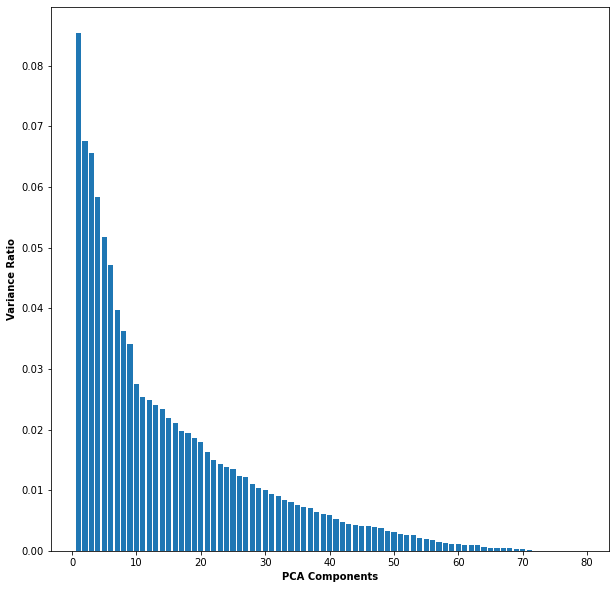

In [46]:
plt.rcParams['figure.figsize'] = (10, 10)
ax = plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.xlabel("PCA Components",fontweight = 'bold')
plt.ylabel("Variance Ratio",fontweight = 'bold')

Text(0, 0.5, 'Cumulative Explained Variance')

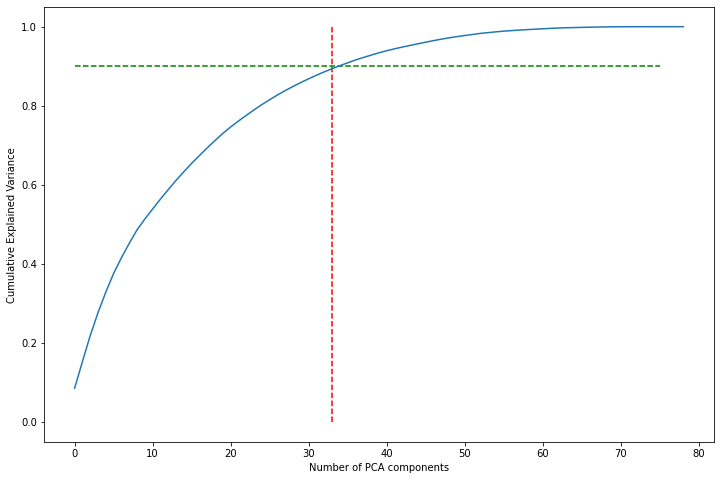

In [47]:
# Scree plot to visualize the Cumulative variance against the Number of components

fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.vlines(x=33, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.90, xmax=75, xmin=0, colors="g", linestyles="--")
plt.xlabel('Number of PCA components')
plt.ylabel('Cumulative Explained Variance')

In [27]:
pca = PCA(n_components=33).fit(dataset)
columns = ['pca_comp_%i' % i for i in range(33)]
dataset  = pd.DataFrame(pca.transform(dataset), columns=columns, index=dataset.index)
dataset.head()

,pca_comp_0,pca_comp_1,pca_comp_2,pca_comp_3,pca_comp_4,pca_comp_5,pca_comp_6,pca_comp_7,pca_comp_8,pca_comp_9,...,pca_comp_23,pca_comp_24,pca_comp_25,pca_comp_26,pca_comp_27,pca_comp_28,pca_comp_29,pca_comp_30,pca_comp_31,pca_comp_32
PT078204494,-0.037678,-0.370635,-0.142732,-0.360890,-1.162221,0.326229,1.207099,0.223074,-0.288159,-0.913270,...,0.162311,0.744406,0.057474,-0.122200,-0.021539,0.091161,-0.178749,0.012006,-0.438170,-0.079164
PT078365773,-0.359530,0.149651,0.292412,-0.569371,0.168048,-0.625488,0.152554,-0.183675,-0.142360,-0.258170,...,0.075180,-0.103591,0.034004,-0.026428,-0.056128,0.059160,-0.087636,-0.218910,0.048091,-0.030343
PT078662296,-0.311323,-0.201099,0.806396,1.221970,0.732069,0.914725,-0.111961,0.020575,-0.343518,-0.226824,...,0.039722,-0.017677,0.017287,-0.030764,-0.087218,0.030998,-0.004951,-0.037370,-0.014698,-0.045501
PT083555314,-0.447064,-0.487013,-0.201148,0.261429,0.173005,-0.109789,-0.568676,-0.005041,-0.365233,-0.083294,...,-0.110709,0.033133,-0.050887,0.026395,0.051939,-0.116446,-0.021382,0.030407,0.035378,0.033346
PT084380630,-0.052538,-0.632700,-0.499128,0.214378,-0.520150,0.304370,0.126584,-0.728804,-0.403875,-0.114944,...,0.021597,-0.482766,-0.193633,0.124070,0.749881,-0.037194,-0.171722,-0.020798,-0.044760,0.023838


In [49]:
#!pip install missingpy

In [50]:
"""
# after installation, these three lines of code are required

import sys
import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base
"""

"\n# after installation, these three lines of code are required\n\nimport sys\nimport sklearn.neighbors._base\nsys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base\n"

In [51]:
"""
from missingpy import MissForest
imputer = MissForest()
dataset = pd.DataFrame(imputer.fit_transform(dataset), columns = dataset.columns)
dataset.head()
"""

'\nfrom missingpy import MissForest\nimputer = MissForest()\ndataset = pd.DataFrame(imputer.fit_transform(dataset), columns = dataset.columns)\ndataset.head()\n'

In [52]:
"""
from sklearn.impute import KNNImputer
knn = KNNImputer(n_neighbors=3)
dataset = pd.DataFrame(knn.fit_transform(dataset), columns = dataset.columns)
"""

'\nfrom sklearn.impute import KNNImputer\nknn = KNNImputer(n_neighbors=3)\ndataset = pd.DataFrame(knn.fit_transform(dataset), columns = dataset.columns)\n'

In [28]:
x = dataset.copy()

In [54]:
x.head()

,pca_comp_0,pca_comp_1,pca_comp_2,pca_comp_3,pca_comp_4,pca_comp_5,pca_comp_6,pca_comp_7,pca_comp_8,pca_comp_9,pca_comp_10,pca_comp_11,pca_comp_12,pca_comp_13,pca_comp_14,pca_comp_15,pca_comp_16,pca_comp_17,pca_comp_18,pca_comp_19,pca_comp_20,pca_comp_21,pca_comp_22,pca_comp_23,pca_comp_24,pca_comp_25,pca_comp_26,pca_comp_27,pca_comp_28,pca_comp_29,pca_comp_30,pca_comp_31,pca_comp_32
PT078204494,-0.037678,-0.370635,-0.142731,-0.360890,-1.162221,0.326229,1.207099,0.223074,-0.288162,-0.913273,-0.091171,-0.303913,-0.157124,0.006584,-0.302717,0.353947,-0.486487,0.067668,0.090706,-0.035221,-0.201364,0.944137,0.410350,0.162196,0.744353,0.057631,-0.122367,-0.021219,0.091424,-0.177803,0.004263,-0.430313,-0.088108
PT078365773,-0.359530,0.149651,0.292412,-0.569371,0.168048,-0.625488,0.152554,-0.183675,-0.142359,-0.258169,0.030461,0.104465,-0.195614,0.434557,-0.107442,0.005134,0.077903,0.037535,-0.028477,-0.133451,-0.056212,0.088701,-0.188903,0.075172,-0.103671,0.033832,-0.026541,-0.056135,0.059353,-0.086320,-0.218662,0.052336,-0.035287
PT078662296,-0.311323,-0.201099,0.806396,1.221970,0.732068,0.914726,-0.111962,0.020575,-0.343519,-0.226826,-0.356540,0.435795,-0.013936,-0.022388,0.120934,-0.183590,0.006824,0.061357,-0.101717,0.010201,-0.252956,-0.042866,0.097289,0.039613,-0.017616,0.017553,-0.030544,-0.087275,0.030249,-0.005741,-0.039975,-0.014023,-0.043488
PT083555314,-0.447064,-0.487013,-0.201148,0.261429,0.173005,-0.109789,-0.568676,-0.005042,-0.365232,-0.083293,-0.606232,0.221905,-0.184282,0.318577,-0.111708,-0.104545,-0.107189,-0.137804,0.176060,0.075919,0.302052,-0.162835,0.264729,-0.110655,0.033165,-0.051015,0.026056,0.052319,-0.116184,-0.021155,0.030667,0.035996,0.031206
PT084380630,-0.052538,-0.632700,-0.499128,0.214378,-0.520150,0.304370,0.126584,-0.728804,-0.403875,-0.114943,-0.410011,0.679617,-0.307223,0.211788,-0.251172,-0.344439,0.235368,-0.246614,0.251467,0.198639,-0.623344,-0.104996,0.184045,0.021861,-0.482677,-0.193837,0.124233,0.750344,-0.034690,-0.169966,-0.020752,-0.043722,0.028518


In [29]:
from sklearn.cluster import KMeans

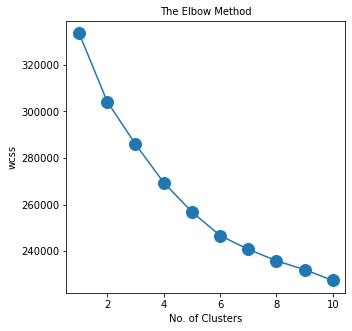

<Figure size 720x720 with 0 Axes>

In [57]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 200, n_init = 10, random_state = 101)
    km.fit(x)
    wcss.append(km.inertia_)

plt.figure(figsize=(5, 5))
plt.plot(range(1, 11), wcss, marker='o', markersize=12)
plt.title('The Elbow Method', fontsize = 10)
plt.xlabel('No. of Clusters', fontsize = 10)
plt.ylabel('wcss', fontsize = 10)
plt.show()
plt.savefig('elbow_hf_diag_super.png')

In [53]:
print(wcss)
print(wcss[1]-wcss[0])
print(wcss[2]-wcss[1])
print(wcss[3]-wcss[2])
print(wcss[4]-wcss[3])
print(wcss[5]-wcss[4])
print(wcss[6]-wcss[5])
print(wcss[7]-wcss[6])
print(wcss[8]-wcss[7])

[1505181.298340455, 1374421.3571354991, 1292165.2469213111, 1236638.5613863927, 1176642.8953005539, 1125428.591278888, 1090303.225241406, 1059196.4614448217, 1037410.2837250448, 1013763.2507573154]
-130759.9412049558
-82256.110214188
-55526.68553491845
-59995.666085838806
-51214.30402166583
-35125.36603748216
-31106.763796584215
-21786.177719776868


In [ ]:
pri

In [30]:
kmeans = KMeans(n_clusters = 6, init = 'k-means++', max_iter = 200, n_init = 10, random_state = 101)
ymeans = kmeans.fit_predict(x)

In [59]:
kmeans.labels_

array([2, 2, 4, ..., 0, 1, 1], dtype=int32)

In [60]:
ymeans

array([2, 2, 4, ..., 0, 1, 1], dtype=int32)

In [31]:
x['Cluster_Id'] = list(ymeans)
x.head()

,pca_comp_0,pca_comp_1,pca_comp_2,pca_comp_3,pca_comp_4,pca_comp_5,pca_comp_6,pca_comp_7,pca_comp_8,pca_comp_9,...,pca_comp_24,pca_comp_25,pca_comp_26,pca_comp_27,pca_comp_28,pca_comp_29,pca_comp_30,pca_comp_31,pca_comp_32,Cluster_Id
PT078204494,-0.037678,-0.370635,-0.142732,-0.360890,-1.162221,0.326229,1.207099,0.223074,-0.288159,-0.913270,...,0.744406,0.057474,-0.122200,-0.021539,0.091161,-0.178749,0.012006,-0.438170,-0.079164,5
PT078365773,-0.359530,0.149651,0.292412,-0.569371,0.168048,-0.625488,0.152554,-0.183675,-0.142360,-0.258170,...,-0.103591,0.034004,-0.026428,-0.056128,0.059160,-0.087636,-0.218910,0.048091,-0.030343,5
PT078662296,-0.311323,-0.201099,0.806396,1.221970,0.732069,0.914725,-0.111961,0.020575,-0.343518,-0.226824,...,-0.017677,0.017287,-0.030764,-0.087218,0.030998,-0.004951,-0.037370,-0.014698,-0.045501,4
PT083555314,-0.447064,-0.487013,-0.201148,0.261429,0.173005,-0.109789,-0.568676,-0.005041,-0.365233,-0.083294,...,0.033133,-0.050887,0.026395,0.051939,-0.116446,-0.021382,0.030407,0.035378,0.033346,1
PT084380630,-0.052538,-0.632700,-0.499128,0.214378,-0.520150,0.304370,0.126584,-0.728804,-0.403875,-0.114944,...,-0.482766,-0.193633,0.124070,0.749881,-0.037194,-0.171722,-0.020798,-0.044760,0.023838,1


In [32]:
x['Cluster_Id'].value_counts()

1    23332
5    20787
0    12976
2    12432
3    11647
4     8081
Name: Cluster_Id, dtype: int64

In [33]:
x.shape

(89255, 34)

In [64]:
x.head(3)

,pca_comp_0,pca_comp_1,pca_comp_2,pca_comp_3,pca_comp_4,pca_comp_5,pca_comp_6,pca_comp_7,pca_comp_8,pca_comp_9,pca_comp_10,pca_comp_11,pca_comp_12,pca_comp_13,pca_comp_14,pca_comp_15,pca_comp_16,pca_comp_17,pca_comp_18,pca_comp_19,pca_comp_20,pca_comp_21,pca_comp_22,pca_comp_23,pca_comp_24,pca_comp_25,pca_comp_26,pca_comp_27,pca_comp_28,pca_comp_29,pca_comp_30,pca_comp_31,pca_comp_32,Cluster_Id
PT078204494,-0.037678,-0.370635,-0.142731,-0.360890,-1.162221,0.326229,1.207099,0.223074,-0.288162,-0.913273,-0.091171,-0.303913,-0.157124,0.006584,-0.302717,0.353947,-0.486487,0.067668,0.090706,-0.035221,-0.201364,0.944137,0.410350,0.162196,0.744353,0.057631,-0.122367,-0.021219,0.091424,-0.177803,0.004263,-0.430313,-0.088108,2
PT078365773,-0.359530,0.149651,0.292412,-0.569371,0.168048,-0.625488,0.152554,-0.183675,-0.142359,-0.258169,0.030461,0.104465,-0.195614,0.434557,-0.107442,0.005134,0.077903,0.037535,-0.028477,-0.133451,-0.056212,0.088701,-0.188903,0.075172,-0.103671,0.033832,-0.026541,-0.056135,0.059353,-0.086320,-0.218662,0.052336,-0.035287,2
PT078662296,-0.311323,-0.201099,0.806396,1.221970,0.732068,0.914726,-0.111962,0.020575,-0.343519,-0.226826,-0.356540,0.435795,-0.013936,-0.022388,0.120934,-0.183590,0.006824,0.061357,-0.101717,0.010201,-0.252956,-0.042866,0.097289,0.039613,-0.017616,0.017553,-0.030544,-0.087275,0.030249,-0.005741,-0.039975,-0.014023,-0.043488,4


In [34]:
after_cluster.shape

(89255, 67)

In [35]:
x.reset_index(inplace = True)

In [36]:
after_cluster.reset_index(inplace = True)

In [51]:
#after_cluster.reset_index(inplace = True)
after_cluster.head()

,ptid,dx_date,dx,gender,birth_yr,ageatindex,race,division,region,ihd_bl,...,ELI_GRP_22,ELI_GRP_23,ELI_GRP_24,ELI_GRP_25,ELI_GRP_26,ELI_GRP_27,ELI_GRP_28,ELI_GRP_29,ELI_GRP_30,ELI_GRP_31
0,PT078204494,2016-05-20,I10,Female,1935,81,Caucasian,East North Central,Midwest,1,...,0,0,0,0,0,0,0,0,0,0
1,PT078365773,2016-01-14,I10,Female,1954,62,African American,East North Central,Midwest,0,...,0,0,0,0,0,0,0,0,0,0
2,PT078662296,2016-07-08,hypertension,Male,1957,59,Caucasian,West North Central,Midwest,0,...,0,1,0,0,0,0,0,0,0,0
3,PT083555314,2016-02-16,I10,Male,1984,32,Caucasian,West North Central,Midwest,0,...,0,0,0,0,0,0,0,0,0,0
4,PT084380630,2016-02-03,I10,Male,1933,83,Caucasian,West North Central,Midwest,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
x.head(3)

,index,pca_comp_0,pca_comp_1,pca_comp_2,pca_comp_3,pca_comp_4,pca_comp_5,pca_comp_6,pca_comp_7,pca_comp_8,...,pca_comp_24,pca_comp_25,pca_comp_26,pca_comp_27,pca_comp_28,pca_comp_29,pca_comp_30,pca_comp_31,pca_comp_32,Cluster_Id
0,PT078204494,-0.037678,-0.370635,-0.142731,-0.360890,-1.162221,0.326228,1.207098,0.223075,-0.288166,...,0.744862,0.056453,-0.122601,-0.024781,0.090060,-0.178082,0.012065,-0.432208,-0.086001,2
1,PT078365773,-0.359530,0.149651,0.292412,-0.569371,0.168048,-0.625488,0.152554,-0.183675,-0.142359,...,-0.103640,0.034064,-0.026172,-0.056261,0.059135,-0.087796,-0.218846,0.049271,-0.033199,2
2,PT078662296,-0.311323,-0.201099,0.806396,1.221970,0.732069,0.914726,-0.111962,0.020575,-0.343516,...,-0.017913,0.017435,-0.030718,-0.086480,0.030406,-0.004934,-0.037725,-0.014170,-0.042444,4


In [37]:
x.rename(columns = {"index": "ptid"}, 
          inplace = True)

In [38]:
after_cluster.shape, x.shape

((89255, 68), (89255, 35))

In [39]:
overall_data = pd.merge(after_cluster, x, on='ptid', how='inner')
overall_data.shape

(89255, 102)

In [56]:
overall_data.head()

,ptid,dx_date,dx,gender,birth_yr,ageatindex,race,division,region,ihd_bl,...,pca_comp_24,pca_comp_25,pca_comp_26,pca_comp_27,pca_comp_28,pca_comp_29,pca_comp_30,pca_comp_31,pca_comp_32,Cluster_Id
0,PT078204494,2016-05-20,I10,Female,1935,81,Caucasian,East North Central,Midwest,1,...,0.744862,0.056453,-0.122601,-0.024781,0.090060,-0.178082,0.012065,-0.432208,-0.086001,2
1,PT078365773,2016-01-14,I10,Female,1954,62,African American,East North Central,Midwest,0,...,-0.103640,0.034064,-0.026172,-0.056261,0.059135,-0.087796,-0.218846,0.049271,-0.033199,2
2,PT078662296,2016-07-08,hypertension,Male,1957,59,Caucasian,West North Central,Midwest,0,...,-0.017913,0.017435,-0.030718,-0.086480,0.030406,-0.004934,-0.037725,-0.014170,-0.042444,4
3,PT083555314,2016-02-16,I10,Male,1984,32,Caucasian,West North Central,Midwest,0,...,0.033265,-0.051018,0.026143,0.051424,-0.116540,-0.020429,0.030357,0.035303,0.032766,1
4,PT084380630,2016-02-03,I10,Male,1933,83,Caucasian,West North Central,Midwest,0,...,-0.482698,-0.193909,0.123307,0.750601,-0.037683,-0.171096,-0.021232,-0.041843,0.024269,1


In [57]:
output_related.head(3)

,ptid,hf_inp_evt_cnsr_flg,hf_inp_evt_cnsr_dt,hf_diag_evt_cnsr_flg,hf_diag_evt_cnsr_dt,datediff_hfinp,datediff_mon_hfinp,datediff_hfdiag,datediff_mon_hfdiag,hf_inp_diag_dt,hfinp_cnt,hf_diag_dt
0,PT078204494,0,2020-12-31,0,2020-12-31,1686,56.200000,1686,56.200000,NaN,0,NaN
1,PT078205983,0,2020-12-31,0,2020-12-31,1733,57.766667,1733,57.766667,NaN,0,NaN
3,PT078332059,0,2020-12-31,0,2020-12-31,1567,52.233333,1567,52.233333,NaN,0,NaN


In [40]:
final_data = pd.merge(overall_data, output_related, on='ptid', how='inner')
final_data.shape

(89255, 113)

In [41]:
overall_data = final_data.copy()

In [86]:
# for interactive visualizations
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
init_notebook_mode(connected = True)
import plotly.figure_factory as ff

In [89]:
cluster_4['ageatindex']

32       62
50       33
53       36
56       51
70       82
         ..
89240    57
89242    58
89243    52
89247    83
89251    78
Name: ageatindex, Length: 12546, dtype: int64

In [90]:
cluster_4.head()

,ptid,Unnamed: 0,Unnamed: 0.1,dx_date,dx,gender,birth_yr,ageatindex,race,division,...,hf_inp_evt_cnsr_dt,hf_diag_evt_cnsr_flg,hf_diag_evt_cnsr_dt,datediff_hfinp,datediff_mon_hfinp,datediff_hfdiag,datediff_mon_hfdiag,hf_inp_diag_dt,hfinp_cnt,hf_diag_dt
32,PT101244571,553,553,2016-06-06,I10,Male,1954,62,Caucasian,East North Central,...,2020-12-31,0,2020-12-31,1669,55.633333,1669,55.633333,NaN,0,NaN
50,PT117458821,852,852,2016-11-22,I10,Female,1983,33,Caucasian,West North Central,...,2020-12-31,0,2020-12-31,1500,50.000000,1500,50.000000,NaN,0,NaN
53,PT136321321,1075,1075,2016-04-19,I10,Male,1980,36,Caucasian,South Atl/West South Crl,...,2020-12-31,0,2020-12-31,1717,57.233333,1717,57.233333,NaN,0,NaN
56,PT140885000,1179,1179,2016-08-31,I10,Male,1965,51,Asian,Middle Atlantic,...,2020-12-31,0,2020-12-31,1583,52.766667,1583,52.766667,NaN,0,NaN
70,PT156725634,1715,1715,2016-06-07,I10,Male,1934,82,Caucasian,Other/Unknown,...,2020-12-31,0,2020-12-31,1668,55.600000,1668,55.600000,NaN,0,NaN


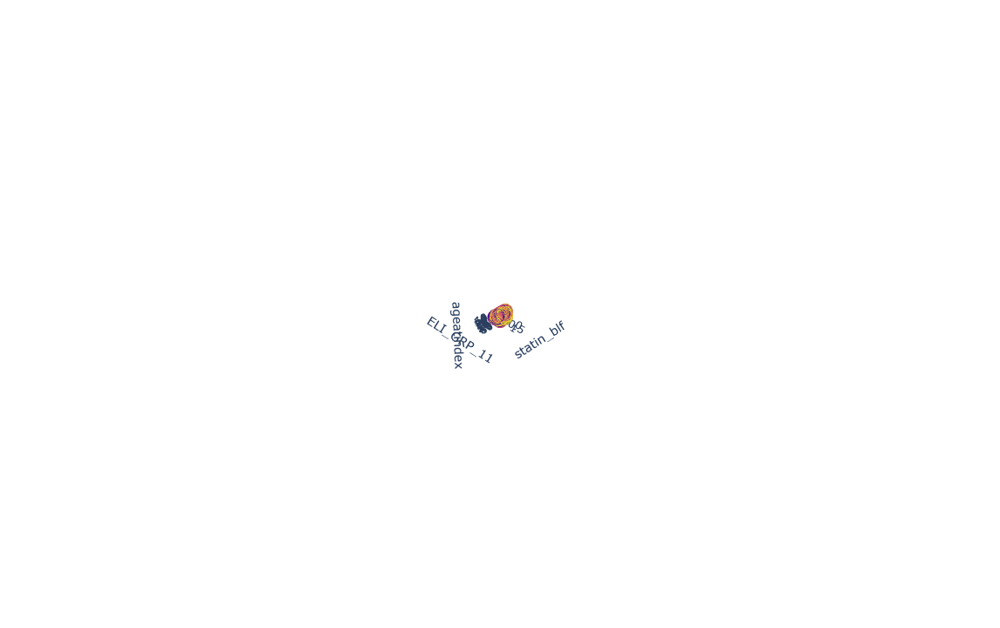

In [92]:

trace1 = go.Scatter3d(
    x= overall_data['statin_blf'],
    y= overall_data['datediff_mon_hfinp'],
    z= overall_data['datediff_mon_hfdiag'],
    mode='markers',
     marker=dict(
        color = overall_data['Cluster_Id'], 
        size= 10,
        line=dict(
            color= overall_data['Cluster_Id'],
            width= 12
        ),
        opacity=0.8
     )
)
df = [trace1]

layout = go.Layout(
    title = 'Character vs Gender vs Alive or not',
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0  
    ),
    scene = dict(
            xaxis = dict(title  = 'statin_blf'),
            yaxis = dict(title  = 'ELI_GRP_11'),
            zaxis = dict(title  = 'ageatindex')
        )
)

fig = go.Figure(data = df, layout = layout)
py.iplot(fig)


In [ ]:
import matplotlib.pyplot as plt

plt.scatter(x,y, c='b', marker='x', label='1')
plt.scatter(x, y, c='r', marker='s', label='-1')
plt.legend(loc='upper left')
plt.show()

In [42]:
cluster_0 = overall_data[overall_data['Cluster_Id']==0]
cluster_1 = overall_data[overall_data['Cluster_Id']==1]
cluster_2 = overall_data[overall_data['Cluster_Id']==2]
cluster_3 = overall_data[overall_data['Cluster_Id']==3]
cluster_4 = overall_data[overall_data['Cluster_Id']==4]
cluster_5 = overall_data[overall_data['Cluster_Id']==5]
#cluster_6 = overall_data[overall_data['Cluster_Id']==6]

In [51]:
#cluster_2.to_csv('hf_diag_11.49_data.csv')

In [44]:
cluster_0.shape, cluster_1.shape, cluster_2.shape, cluster_3.shape, cluster_4.shape, cluster_5.shape

((12976, 113),
 (23332, 113),
 (12432, 113),
 (11647, 113),
 (8081, 113),
 (20787, 113))

In [40]:
after_cluster.columns

Index(['ptid', 'dx_date', 'dx', 'gender', 'birth_yr', 'ageatindex', 'race',
       'division', 'region', 'ihd_bl', 'af_bl', 'ckd_bl', 'obesity_bl',
       'rf_bl', 'diabetes_bl', 'cvd_bl', 'dementia_bl', 'valvular_dis_bl',
       'bmi_bl', 'sbp_bl', 'dbp_bl', 'plt_bl', 'egfrs_bl', 'pr_bl', 'first_dt',
       'last_dt', 'lp_dr_blf', 'dpp4_inh_blf', 'mra_blf', 'beta_blckr_blf',
       'acei_blf', 'cal_chn_blckr_blf', 'chllow_blf', 'statin_blf', 'arb_blf',
       'Biguanides_blf', 'insln_inj_blf', 'ELI_GRP_01', 'ELI_GRP_02',
       'ELI_GRP_03', 'ELI_GRP_04', 'ELI_GRP_05', 'ELI_GRP_06', 'ELI_GRP_07',
       'ELI_GRP_08', 'ELI_GRP_09', 'ELI_GRP_10', 'ELI_GRP_11', 'ELI_GRP_12',
       'ELI_GRP_13', 'ELI_GRP_14', 'ELI_GRP_15', 'ELI_GRP_16', 'ELI_GRP_17',
       'ELI_GRP_18', 'ELI_GRP_19', 'ELI_GRP_20', 'ELI_GRP_21', 'ELI_GRP_22',
       'ELI_GRP_23', 'ELI_GRP_24', 'ELI_GRP_25', 'ELI_GRP_26', 'ELI_GRP_27',
       'ELI_GRP_28', 'ELI_GRP_29', 'ELI_GRP_30', 'ELI_GRP_31'],
      dtype='object')

In [65]:
cluster_0['hf_diag_dt']

12       NaN
15       NaN
18       NaN
19       NaN
28       NaN
        ... 
89235    NaN
89238    NaN
89241    NaN
89245    NaN
89252    NaN
Name: hf_diag_dt, Length: 12999, dtype: object

In [45]:
cluster_0_eql_0 = cluster_0[cluster_0['hf_diag_dt'].isnull()]
cluster_0_grt_0 = cluster_0[~cluster_0['hf_diag_dt'].isnull()]
print(cluster_0.shape[0])
print(cluster_0_eql_0.shape[0])
print(cluster_0_grt_0.shape[0])
(cluster_0_eql_0.shape[0]*100)/cluster_0.shape[0], (cluster_0_grt_0.shape[0]*100)/cluster_0.shape[0]

12976
12083
893


(93.11806411837237, 6.88193588162762)

In [46]:
cluster_1_eql_0 = cluster_1[cluster_1['hf_diag_dt'].isnull()]
cluster_1_grt_0 = cluster_1[~cluster_1['hf_diag_dt'].isnull()]
print(cluster_1.shape[0])
print(cluster_1_eql_0.shape[0])
print(cluster_1_grt_0.shape[0])
(cluster_1_eql_0.shape[0]*100)/cluster_1.shape[0], (cluster_1_grt_0.shape[0]*100)/cluster_1.shape[0]

23332
22076
1256


(94.61683524772845, 5.383164752271559)

In [47]:
cluster_2_eql_0 = cluster_2[cluster_2['hf_diag_dt'].isnull()]
cluster_2_grt_0 = cluster_2[~cluster_2['hf_diag_dt'].isnull()]
print(cluster_2.shape[0])
print(cluster_2_eql_0.shape[0])
print(cluster_2_grt_0.shape[0])
(cluster_2_eql_0.shape[0]*100)/cluster_2.shape[0], (cluster_2_grt_0.shape[0]*100)/cluster_2.shape[0]

12432
11003
1429


(88.50546975546976, 11.494530244530244)

In [48]:
cluster_3_eql_0 = cluster_3[cluster_3['hf_diag_dt'].isnull()]
cluster_3_grt_0 = cluster_3[~cluster_3['hf_diag_dt'].isnull()]
print(cluster_3.shape[0])
print(cluster_3_eql_0.shape[0])
print(cluster_3_grt_0.shape[0])
(cluster_3_eql_0.shape[0]*100)/cluster_3.shape[0], (cluster_3_grt_0.shape[0]*100)/cluster_3.shape[0]

11647
11123
524


(95.50098737872413, 4.499012621275865)

In [49]:
cluster_4_eql_0 = cluster_4[cluster_4['hf_diag_dt'].isnull()]
cluster_4_grt_0 = cluster_4[~cluster_4['hf_diag_dt'].isnull()]
print(cluster_4.shape[0])
print(cluster_4_eql_0.shape[0])
print(cluster_4_grt_0.shape[0])
(cluster_4_eql_0.shape[0]*100)/cluster_4.shape[0], (cluster_4_grt_0.shape[0]*100)/cluster_4.shape[0]

8081
7830
251


(96.89394876871674, 3.106051231283257)

In [50]:
cluster_5_eql_0 = cluster_5[cluster_5['hf_diag_dt'].isnull()]
cluster_5_grt_0 = cluster_5[~cluster_5['hf_diag_dt'].isnull()]
print(cluster_5.shape[0])
print(cluster_5_eql_0.shape[0])
print(cluster_5_grt_0.shape[0])
(cluster_5_eql_0.shape[0]*100)/cluster_5.shape[0], (cluster_5_grt_0.shape[0]*100)/cluster_5.shape[0]

20787
19789
998


(95.19892240342521, 4.801077596574783)

In [52]:
from lifelines import KaplanMeierFitter, CoxPHFitter

In [73]:
#!pip install lifelines

In [74]:
from lifelines.statistics import logrank_test

In [53]:
kmf = KaplanMeierFitter()

In [240]:
X= cluster_2['datediff_mon_hfinp']
Y = cluster_2['hf_inp_evt_cnsr_flg']

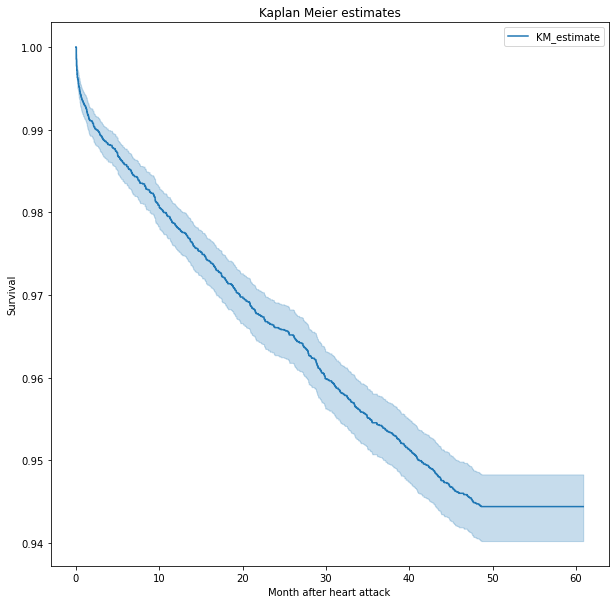

In [241]:
kmf.fit(X, event_observed = Y)
kmf.plot()
plt.title("Kaplan Meier estimates")
plt.xlabel("Month after heart attack")
plt.ylabel("Survival")
plt.show()

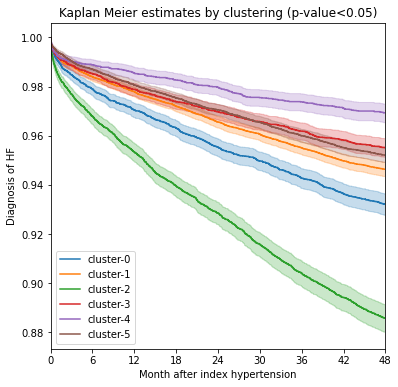

In [54]:
#ax = plt.subplot(111, figsize=(12, 6))
#plt.figure(figsize=(5,5))
fig, ax = plt.subplots(figsize=(6, 6))
a = 'datediff_mon_hfdiag'
b = 'hf_diag_evt_cnsr_flg'
kmf.fit(cluster_0[a], event_observed = cluster_0[b], label='cluster-0')
kmf.plot(ax = ax)

kmf.fit(cluster_1[a], event_observed = cluster_1[b], label='cluster-1')
kmf.plot(ax = ax)

kmf.fit(cluster_2[a], event_observed = cluster_2[b], label='cluster-2')
kmf.plot(ax = ax)

kmf.fit(cluster_3[a], event_observed = cluster_3[b], label='cluster-3')
kmf.plot(ax = ax)

kmf.fit(cluster_4[a], event_observed = cluster_4[b], label='cluster-4')
kmf.plot(ax = ax)

kmf.fit(cluster_5[a], event_observed = cluster_5[b], label='cluster-5')
kmf.plot(ax = ax)


plt.title("Kaplan Meier estimates by clustering (p-value<0.05)")
plt.xlabel("Month after index hypertension")
plt.xlim(0, 48)
plt.xticks([0, 6, 12, 18, 24, 30, 36, 42, 48])
plt.ylabel("Diagnosis of HF")
plt.savefig('survival_hf_diag_super.png')

In [80]:
x_0 = cluster_0['datediff_mon_hfinp']
y_0 = cluster_0['hf_inp_evt_cnsr_flg']

x_1 = cluster_1['datediff_mon_hfinp']
y_1 = cluster_1['hf_inp_evt_cnsr_flg']

x_2 = cluster_2['datediff_mon_hfinp']
y_2 = cluster_2['hf_inp_evt_cnsr_flg']

x_3 = cluster_3['datediff_mon_hfinp']
y_3 = cluster_3['hf_inp_evt_cnsr_flg']

x_4 = cluster_4['datediff_mon_hfinp']
y_4 = cluster_4['hf_inp_evt_cnsr_flg']

x_5 = cluster_5['datediff_mon_hfinp']
y_5 = cluster_5['hf_inp_evt_cnsr_flg']


In [81]:
results_stat = logrank_test(x_0, x_1, x_2, x_3, x_4, x_5,  event_observed_0 = y_0, event_observed_1 =  y_1,  event_observed_2 = y_2,
                             event_observed_3 = y_3,  event_observed_4 = y_4, event_observed_5 =  y_5)

AssertionError: inputs must be of the same length.

In [82]:
results_stat = logrank_test(x_0, x_1, event_observed_0 = y_0, event_observed_1 =  y_1)

In [83]:
results_stat.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
  event_observed_0 = 28       0
32       0
40       0
47       1
50       0
        ..
89242    0
89243    0
89245    0
89247    0
89251    0
Name: hf_inp_evt_cnsr_flg, Length: 15554, dtype: int64
  event_observed_1 = 5        0
6        0
10       0
13       0
14       0
        ..
89175    0
89176    0
89201    0
89211    0
89239    0
Name: hf_inp_evt_cnsr_flg, Length: 11620, dtype: int64
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          38.21 <0.005     30.55

In [85]:
#overall_data.to_csv('6_clusters.csv')

In [55]:
future_data.columns

Index(['dx_date', 'dx', 'gender', 'birth_yr', 'ageatindex', 'race', 'division',
       'region', 'ihd_bl', 'af_bl', 'ckd_bl', 'obesity_bl', 'rf_bl',
       'diabetes_bl', 'cvd_bl', 'dementia_bl', 'valvular_dis_bl', 'bmi_bl',
       'sbp_bl', 'dbp_bl', 'plt_bl', 'egfrs_bl', 'pr_bl', 'first_dt',
       'last_dt', 'lp_dr_blf', 'dpp4_inh_blf', 'mra_blf', 'beta_blckr_blf',
       'acei_blf', 'cal_chn_blckr_blf', 'chllow_blf', 'statin_blf', 'arb_blf',
       'Biguanides_blf', 'insln_inj_blf', 'ELI_GRP_01', 'ELI_GRP_02',
       'ELI_GRP_03', 'ELI_GRP_04', 'ELI_GRP_05', 'ELI_GRP_06', 'ELI_GRP_07',
       'ELI_GRP_08', 'ELI_GRP_09', 'ELI_GRP_10', 'ELI_GRP_11', 'ELI_GRP_12',
       'ELI_GRP_13', 'ELI_GRP_14', 'ELI_GRP_15', 'ELI_GRP_16', 'ELI_GRP_17',
       'ELI_GRP_18', 'ELI_GRP_19', 'ELI_GRP_20', 'ELI_GRP_21', 'ELI_GRP_22',
       'ELI_GRP_23', 'ELI_GRP_24', 'ELI_GRP_25', 'ELI_GRP_26', 'ELI_GRP_27',
       'ELI_GRP_28', 'ELI_GRP_29', 'ELI_GRP_30', 'ELI_GRP_31'],
      dtype='object')

In [56]:
future_data.drop(['dx_date', 'first_dt', 'last_dt'], axis=1, inplace=True)

In [57]:
columns = future_data.columns.tolist()


In [93]:
cluster_0_analysis = cluster_0[columns]
cluster_0_analysis.describe()

,birth_yr,ageatindex,ihd_bl,af_bl,ckd_bl,obesity_bl,rf_bl,diabetes_bl,cvd_bl,dementia_bl,valvular_dis_bl,bmi_bl,sbp_bl,dbp_bl,plt_bl,egfrs_bl,pr_bl,lp_dr_blf,dpp4_inh_blf,mra_blf,beta_blckr_blf,acei_blf,cal_chn_blckr_blf,chllow_blf,statin_blf,arb_blf,Biguanides_blf,insln_inj_blf,ELI_GRP_01,ELI_GRP_02,ELI_GRP_03,ELI_GRP_04,ELI_GRP_05,ELI_GRP_06,ELI_GRP_07,ELI_GRP_08,ELI_GRP_09,ELI_GRP_10,ELI_GRP_11,ELI_GRP_12,ELI_GRP_13,ELI_GRP_14,ELI_GRP_15,ELI_GRP_16,ELI_GRP_17,ELI_GRP_18,ELI_GRP_19,ELI_GRP_20,ELI_GRP_21,ELI_GRP_22,ELI_GRP_23,ELI_GRP_24,ELI_GRP_25,ELI_GRP_26,ELI_GRP_27,ELI_GRP_28,ELI_GRP_29,ELI_GRP_30,ELI_GRP_31
count,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.0,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.00000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000,12997.0,12997.000000,12997.000000,12997.00000,12997.000000,12997.000000,12997.000000,12997.000000,12997.000000
mean,1962.303993,53.696007,0.119027,0.050627,0.043933,1.0,0.057244,0.318073,0.014465,0.008771,0.034469,38.64401,138.640455,81.216050,302.351504,82.148188,81.084712,0.031084,0.010310,0.006617,0.133185,0.152728,0.066400,0.006386,0.184504,0.057629,0.092329,0.003539,0.012772,0.132800,0.038317,0.019466,0.037470,0.972224,0.043702,0.014080,0.052474,0.149342,0.263753,0.132492,0.119643,0.045472,0.039240,0.005232,0.001385,0.002539,0.008233,0.042856,0.028699,0.027160,1.0,0.010849,0.113795,0.00754,0.029776,0.035624,0.032623,0.015927,0.149727
std,13.380675,13.380675,0.323833,0.219243,0.204954,0.0,0.232317,0.465746,0.119402,0.093247,0.182439,8.14575,21.428438,14.419269,4411.357696,22.870002,15.679956,0.173552,0.101018,0.081078,0.339787,0.359739,0.248989,0.079660,0.387910,0.233049,0.289501,0.059389,0.112294,0.339371,0.191967,0.138161,0.189918,0.164336,0.204440,0.117826,0.222989,0.356439,0.440684,0.339038,0.324556,0.208345,0.194173,0.072146,0.037190,0.050327,0.090363,0.202540,0.166965,0.162556,0.0,0.103594,0.317575,0.08651,0.169976,0.185357,0.177654,0.125197,0.356817
min,1933.000000,18.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,7.80000,6.000000,0.000000,0.180000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1953.000000,45.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,32.80000,124.000000,72.000000,203.000000,69.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1961.000000,55.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,37.10000,138.000000,81.000000,244.000000,82.000000,80.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.0000

In [94]:
cluster_0_analysis.describe(include=['object'])

,dx,gender,race,division,region
count,12997,12997,12997,12997,12997
unique,2,3,4,9,5
top,I10,Female,Caucasian,East North Central,Midwest
freq,11900,6938,10011,6724,8256


In [95]:
cluster_1_analysis = cluster_1[columns]
cluster_1_analysis.describe().T

,count,mean,std,min,25%,50%,75%,max
birth_yr,23326.0,1959.540041,13.826452,1933.00,1950.0,1959.0,1969.0,1998.0
ageatindex,23326.0,56.459959,13.826452,18.00,47.0,57.0,66.0,83.0
ihd_bl,23326.0,0.147732,0.354842,0.00,0.0,0.0,0.0,1.0
af_bl,23326.0,0.057961,0.233675,0.00,0.0,0.0,0.0,1.0
ckd_bl,23326.0,0.026065,0.159333,0.00,0.0,0.0,0.0,1.0
obesity_bl,23326.0,0.000000,0.000000,0.00,0.0,0.0,0.0,0.0
rf_bl,23326.0,0.041027,0.198357,0.00,0.0,0.0,0.0,1.0
diabetes_bl,23326.0,0.000300,0.017321,0.00,0.0,0.0,0.0,1.0
cvd_bl,23326.0,0.021350,0.144550,0.00,0.0,0.0,0.0,1.0
dementia_bl,23326.0,0.014790,0.120716,0.00,0.0,0.0,0.0,1.0


In [96]:
cluster_1_analysis.describe(include=['object']).T

,count,unique,top,freq
dx,23326,2,I10,22565
gender,23326,1,Male,23326
race,23326,4,Caucasian,19031
division,23326,8,East North Central,13779
region,23326,5,Midwest,17057


# Summary

In [58]:
cluster_0_analysis = cluster_0[columns]
cluster_1_analysis = cluster_1[columns]
cluster_2_analysis = cluster_2[columns]
cluster_3_analysis = cluster_3[columns]
cluster_4_analysis = cluster_4[columns]
cluster_5_analysis = cluster_5[columns]
#cluster_6_analysis = cluster_6[columns]

In [59]:
frames = [cluster_0_analysis.describe().T, cluster_1_analysis.describe().T, cluster_2_analysis.describe().T, 
          cluster_3_analysis.describe().T, cluster_4_analysis.describe().T, cluster_5_analysis.describe().T
         ]

result = pd.concat(frames, axis=1, join="inner")
result.shape

(59, 48)

In [60]:
result.to_csv('summary_hf_diag_super_con.csv')

In [61]:
frames_cat = [cluster_0_analysis.describe(include=['object']).T, cluster_1_analysis.describe(include=['object']).T, 
          cluster_2_analysis.describe(include=['object']).T, cluster_3_analysis.describe(include=['object']).T, 
          cluster_4_analysis.describe(include=['object']).T, cluster_5_analysis.describe(include=['object']).T
             ]

result_cat = pd.concat(frames_cat, axis=1, join="inner")
result_cat.shape

(5, 24)

In [62]:
result_cat.to_csv('summary_hf_diag_super_cat.csv')

In [260]:
result_cat

,count,unique,top,freq,count,unique,top,freq,count,unique,...,top,freq,count,unique,top,freq,count,unique,top,freq
dx,12991,2,I10,11901,23327,2,I10,22565,12428,2,...,I10,9415,8084,1,hypertension,8084,20785,2,I10,20193
gender,12991,3,Female,6935,23327,1,Male,23327,12428,2,...,Male,5926,8084,3,Female,4317,20785,2,Female,20777
race,12991,4,Caucasian,10007,23327,4,Caucasian,19032,12428,4,...,Caucasian,8200,8084,4,Caucasian,6365,20785,4,Caucasian,16404
division,12991,9,East North Central,6725,23327,8,East North Central,13779,12428,9,...,South Atl/West South Crl,11618,8084,9,East North Central,2753,20785,8,East North Central,12955
region,12991,5,Midwest,8257,23327,5,Midwest,17058,12428,5,...,South,11640,8084,5,Midwest,4995,20785,5,Midwest,15420


# ROUGH WORK

In [113]:
df = dataset.copy()

In [ ]:
from sklearn.metrics import silhouette_score

# Silhouette score analysis to find the ideal number of clusters for K-means clustering

range_n_clusters = [3, 4, 5, 6, 7]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=10,random_state= 100)
    kmeans.fit(x)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(df, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=3, the silhouette score is 0.06788872693432829


In [114]:
from scipy.cluster.hierarchy import linkage, dendrogram, cut_tree

In [33]:
mergings = linkage(df, method='single',metric='euclidean')
dendrogram(mergings)
plt.show()

MemoryError: Unable to allocate 708. GiB for an array with shape (95001135778,) and data type float64